### Notebook for the GRN inference on COPD - IAV using `cellroacle`

- **Developed by**: Carlos Talavera-López Ph.D
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230622

### Import required libraries

In [9]:
import os
import sys

import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

import celloracle as co
co.__version__

'0.12.0'

In [2]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok = True)

- Set up working environment

In [3]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = (15,7)
plt.rcParams["savefig.dpi"] = 600

### Load datasets

In [4]:
BrEpit_mixed = sc.read_h5ad('../../../data/Epithelial_Mixed_ctl230608_states.raw.h5ad') 
BrEpit_mixed

AnnData object with n_obs × n_vars = 12256 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', '

In [5]:
print(f"Cell number is :{BrEpit_mixed.shape[0]}")
print(f"Gene number is :{BrEpit_mixed.shape[1]}")

Cell number is :12256
Gene number is :27208


### Subset condition of interest

In [6]:
BrEpit_mixed.obs['group'].value_counts()

copd_iav        6164
healthy_iav     4104
copd_ctrl       1271
healthy_ctrl     717
Name: group, dtype: int64

In [7]:
adata = BrEpit_mixed[BrEpit_mixed.obs['group'].isin(['copd_iav'])]
adata

View of AnnData object with n_obs × n_vars = 6164 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts

In [10]:
adata_log = anndata.AnnData(X = adata.X,  var = adata.var, obs = adata.obs)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)
adata_log.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(adata_log, inplace = False)["X"])

In [11]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :6164
Gene number is :27208


In [12]:
print(f"Cell number is :{adata.shape[0]}")

Cell number is :6164


### Reduce the inference workload by select HVGs

In [13]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)

adata

AnnData object with n_obs × n_vars = 6164 × 3000
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_

### Load base GRN

In [14]:
peaks = pd.read_parquet("Epithelial_lung_base_GRN_dataframe.parquet")
peaks.head()

,peak_id,gene_short_name,9430076C15Rik,AC002126.6,AC012531.1,AC226150.2,AFP,AHR,AHRR,AIRE,...,Znf431,Zscan10,Zscan26,Zscan4,arnt,cMyc,cebpa,nMyc,p53,p63
0,chr10_100346875_100347053,SCD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_100346947_100347161,SCD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,chr10_100347087_100347438,SCD,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,chr10_100372680_100372946,OLMALINC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_101130776_101130905,TLX1NB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Make Oracle object

In [15]:
oracle = co.Oracle()

In [16]:
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

Metadata columns : ['sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states']
Dimensional reduction:  ['X_pca', 'X_scANVI', 'X_scVI', 'X_umap']


In [17]:
oracle.import_anndata_as_raw_count(adata = adata,
                                   cluster_column_name = "mixed_states",
                                   embedding_name = "X_scANVI")

In [18]:
oracle.import_TF_data(TF_info_matrix = peaks)

### KNN imputation

In [19]:
oracle.perform_PCA()

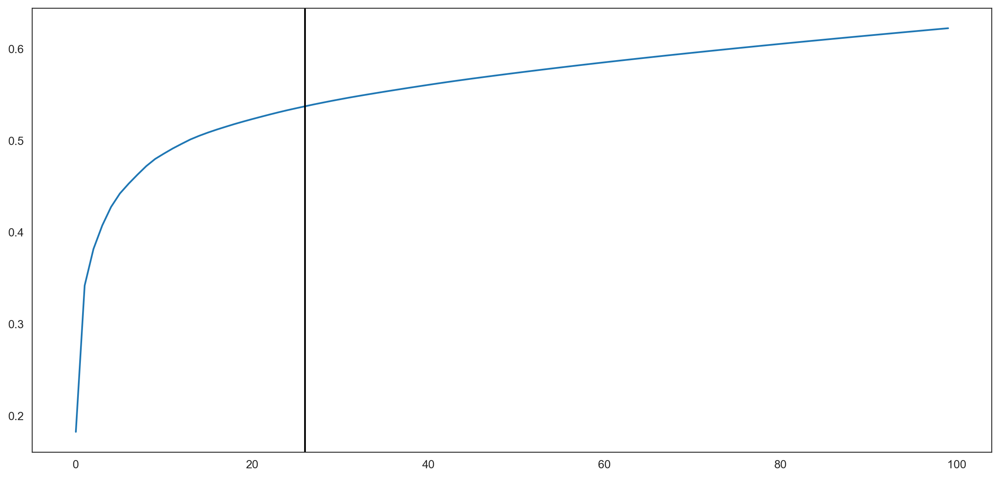

26


In [20]:
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c = "k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

- Estimate the optimal number of nearest neighbors for KNN imputation.

In [21]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :6164


In [22]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :154


In [23]:
oracle.knn_imputation(n_pca_dims = n_comps, k = k, balanced = True, b_sight = k*8,
                      b_maxl = k*4, n_jobs = 4)

-  Save and Load

### GRN calculation

In [24]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
Bio                 1.81
PIL                 9.2.0
appdirs             1.4.4
appnope             0.1.3
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
biothings_client    0.3.0
brotli              NA
celloracle          0.12.0
certifi             2022.12.07
cffi                1.15.1
charset_normalizer  2.1.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
defusedxml          0.7.1
diskcache           5.4.0
executing           1.2.0
filelock            3.10.2
genomepy            0.15.0
gimmemotifs         0.17.0
goatools            1.3.1
google              NA
h5py                3.8.0
hypergeom_ufunc     NA
idna                3.4
igraph              0.10.4
invgauss_ufunc      NA
ipykernel           6.22.0
ipython_genutils    0.2.0
ipywidgets          8.0.5
iter

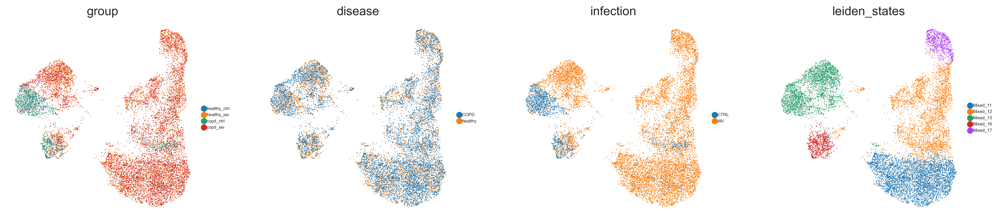

In [27]:
sc.pl.umap(BrEpit_mixed, frameon = False, color = ['group', 'disease', 'infection', 'leiden_states'], size = 3, legend_fontsize = 5, ncols = 4)

In [28]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = (15,7)
plt.rcParams["savefig.dpi"] = 600

In [29]:
%%time
links = oracle.get_links(cluster_name_for_GRN_unit = "mixed_states", alpha = 10,
                         verbose_level = 10)

  0%|          | 0/10 [00:00<?, ?it/s]

Inferring GRN for Basal_IGFBP6+...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for Basal_SERPINE1+...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for Basal_SERPINE2+...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for Club_DHRS9+...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for Goblet_RARRES1+...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for Goblet_STEAP4+...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for SupraB_KRT16+...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for iavAT2_lip...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for iavClub_SAA1+...


  0%|          | 0/444 [00:00<?, ?it/s]

Inferring GRN for iavEpi...


  0%|          | 0/444 [00:00<?, ?it/s]

CPU times: user 1min 31s, sys: 4.53 s, total: 1min 35s
Wall time: 2min 23s


In [30]:
links.links_dict.keys()

dict_keys(['Basal_IGFBP6+', 'Basal_SERPINE1+', 'Basal_SERPINE2+', 'Club_DHRS9+', 'Goblet_RARRES1+', 'Goblet_STEAP4+', 'SupraB_KRT16+', 'iavAT2_lip', 'iavClub_SAA1+', 'iavEpi'])

In [31]:
links.links_dict["Basal_SERPINE2+"]

,source,target,coef_mean,coef_abs,p,-logp
0,NR3C2,ABLIM2,0.007781,0.007781,2.286932e-07,6.640747
1,MAFF,ABLIM2,-0.000460,0.000460,4.845372e-01,0.314673
2,MEF2A,ACHE,-0.001831,0.001831,2.905269e-05,4.536814
3,MYC,ACHE,-0.001396,0.001396,5.831174e-05,4.234244
4,ATF3,ACHE,-0.000151,0.000151,4.759618e-01,0.322428
...,...,...,...,...,...,...
5288,PRDM1,ZSCAN22,-0.001086,0.001086,4.231675e-04,3.373488
5289,NHLH2,ZSCAN22,-0.000676,0.000676,5.335646e-04,3.272813
5290,GATA3,ZSCAN22,-0.002337,0.002337,5.619225e-04,3.250324
5291,ESR1,ZSCAN22,-0.000581,0.000581,2.694130e-01,0.569581


### Network preprocessing

In [32]:
links.filter_links(p = 0.001, weight = "coef_abs", threshold_number = 2000)

Basal_IGFBP6+


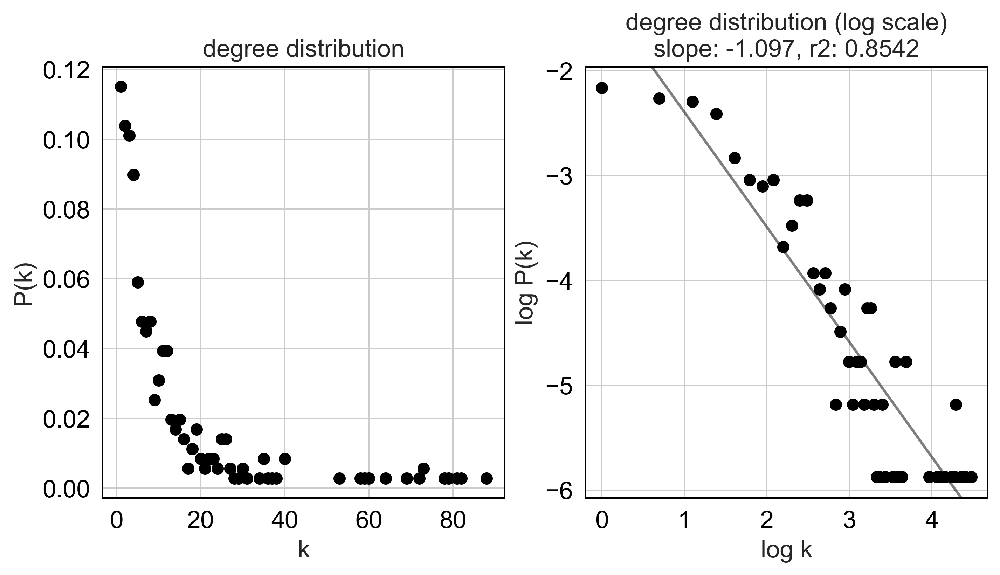

Basal_SERPINE1+


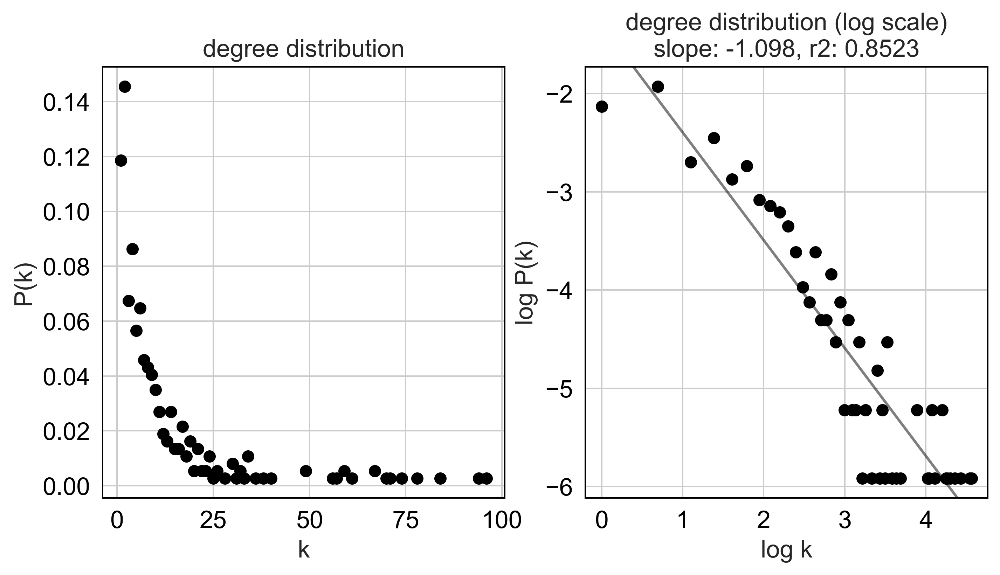

Basal_SERPINE2+


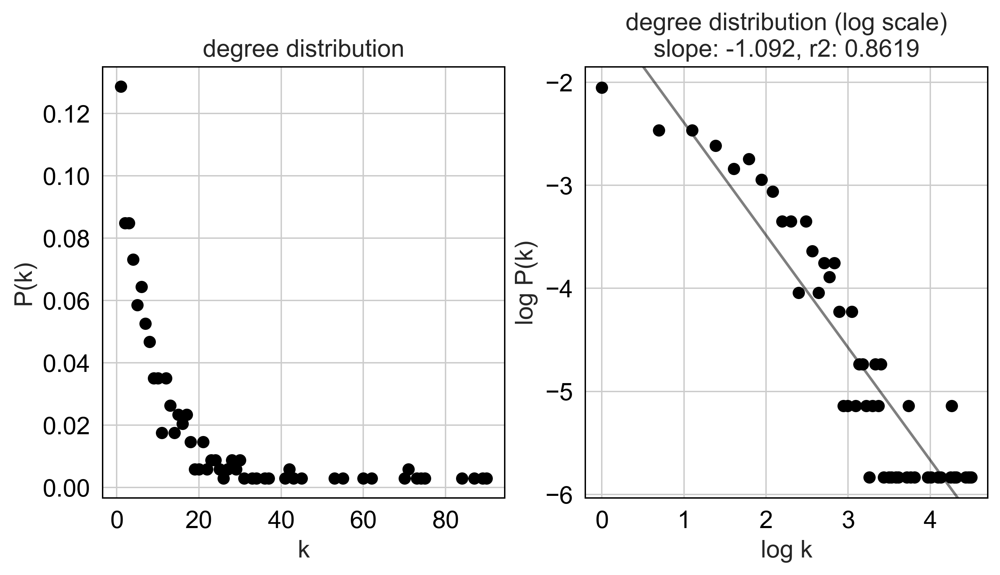

Club_DHRS9+


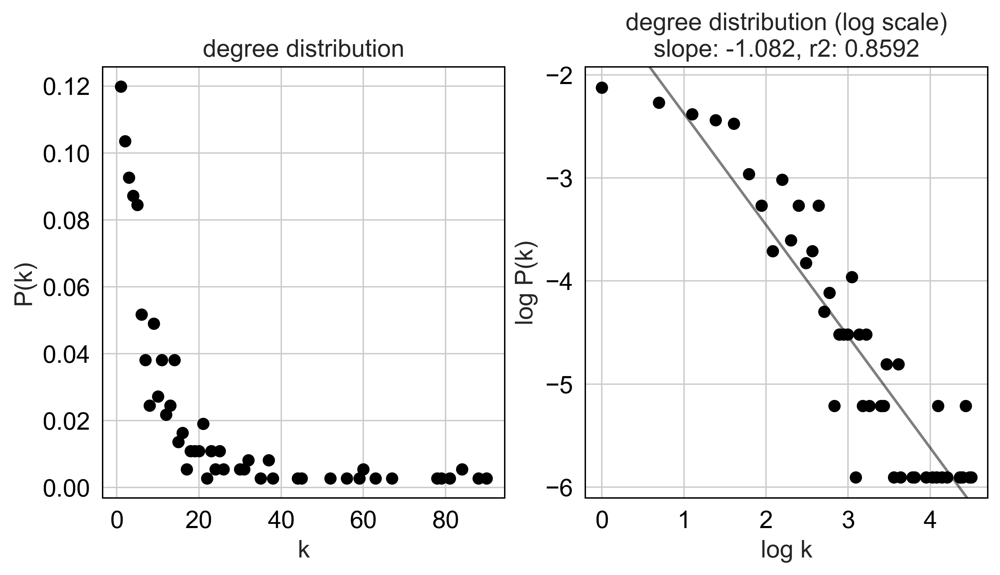

Goblet_RARRES1+


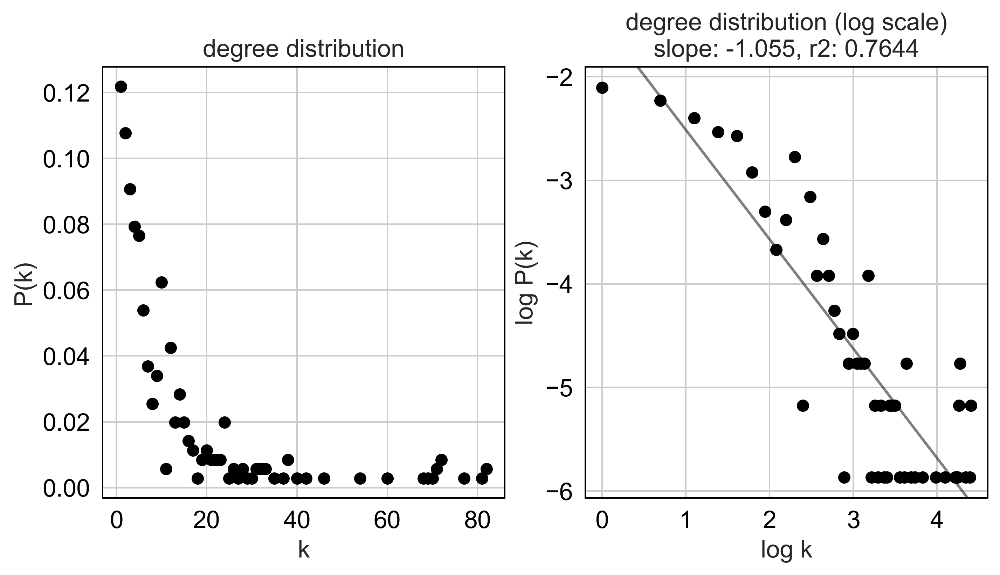

Goblet_STEAP4+


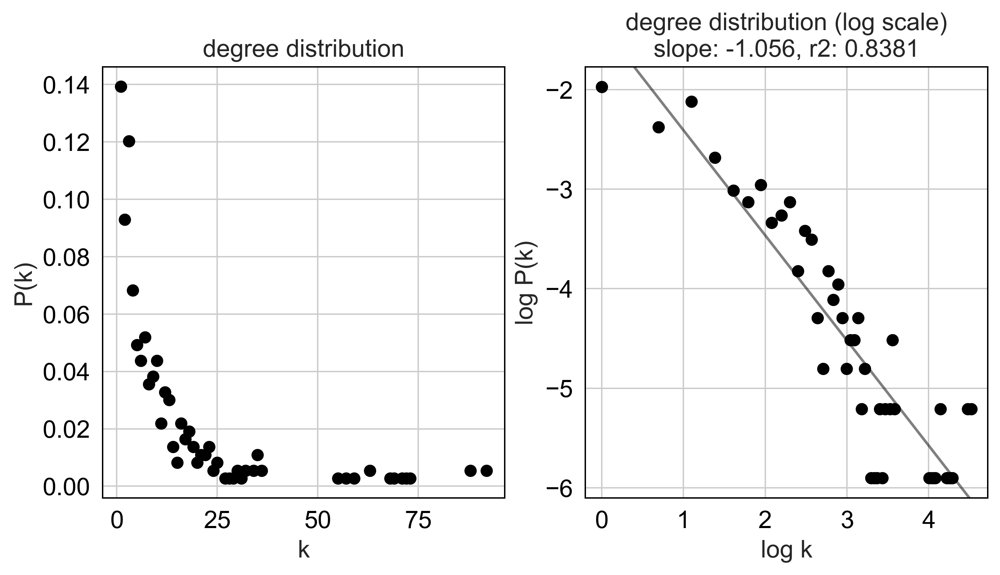

SupraB_KRT16+


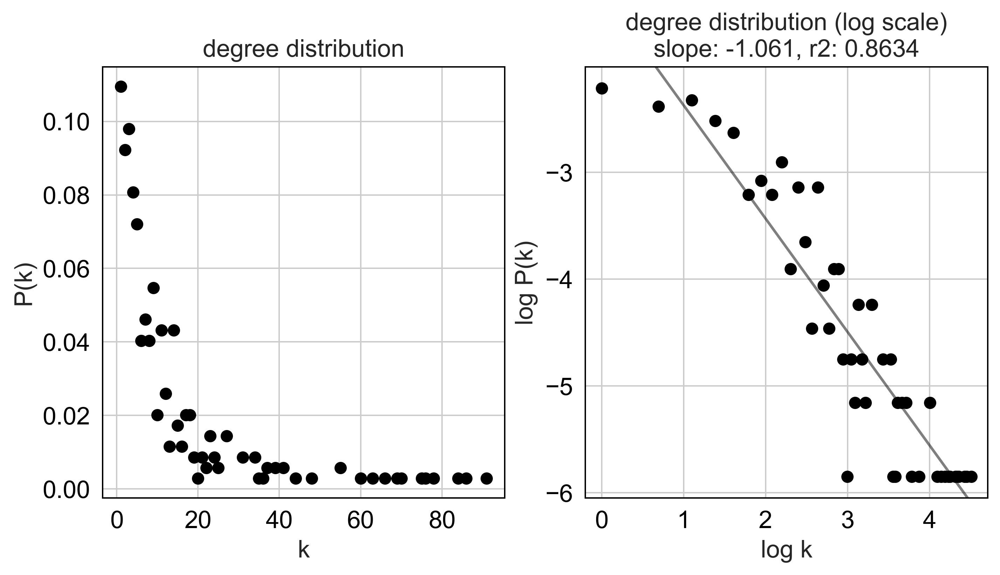

iavAT2_lip


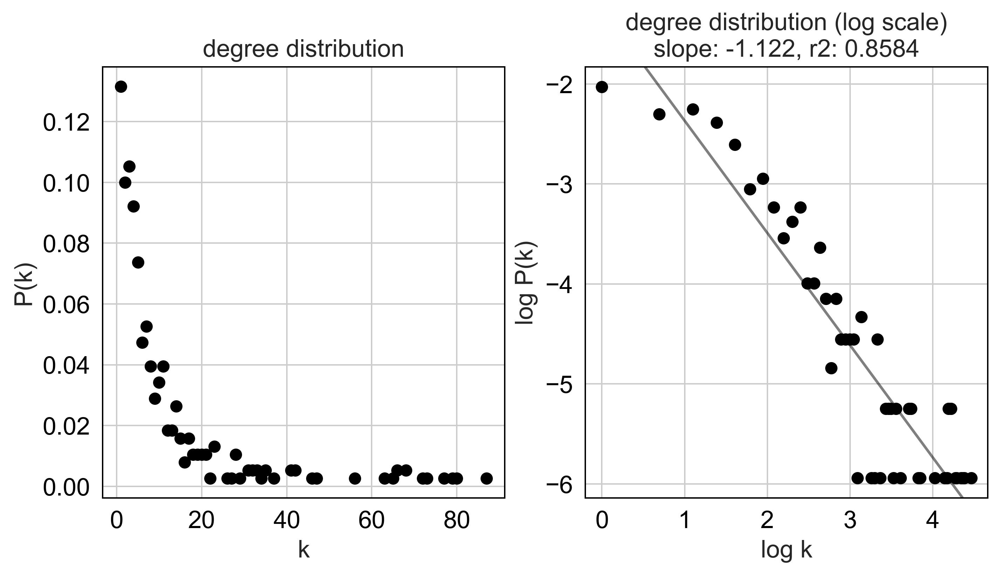

iavClub_SAA1+


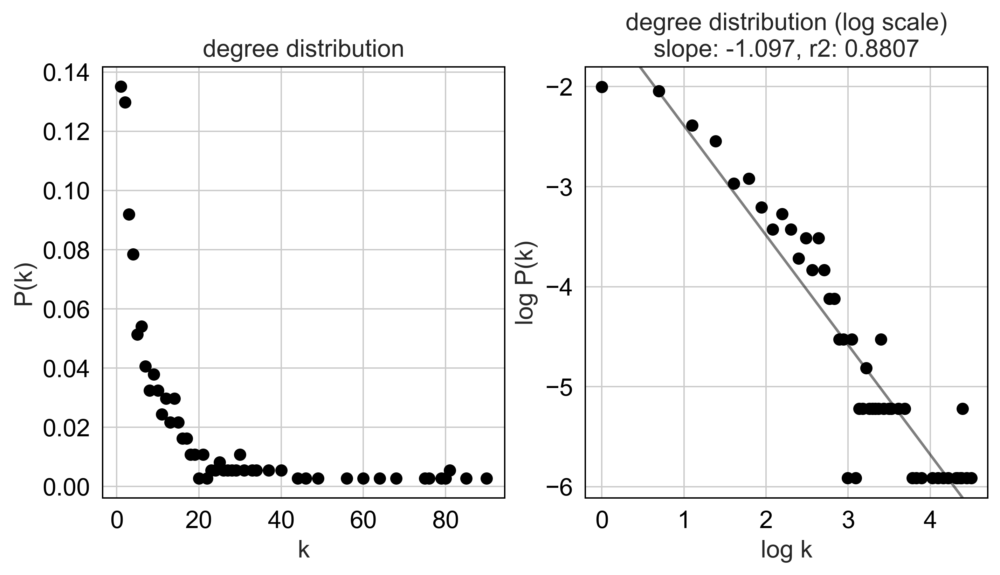

iavEpi


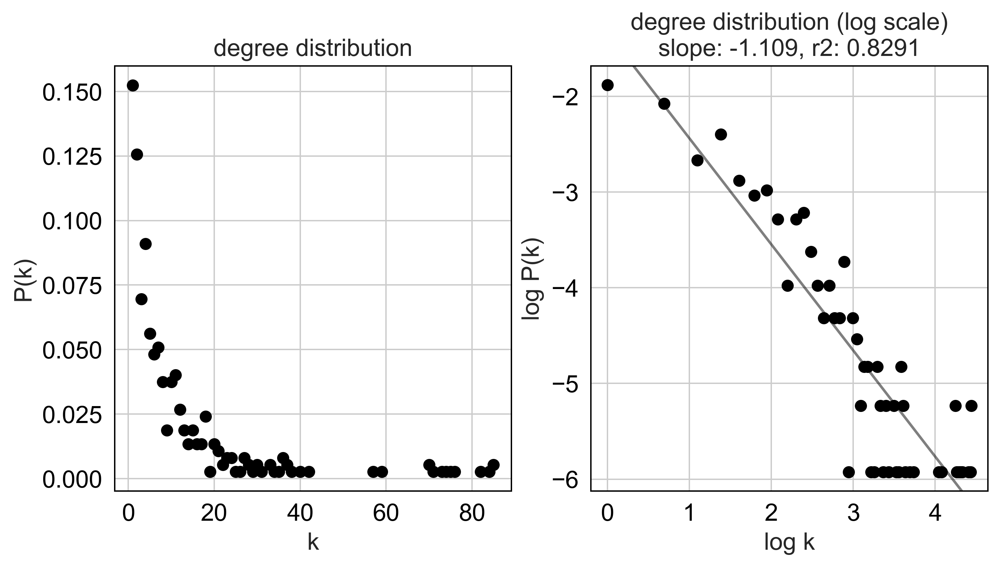

In [33]:
plt.rcParams["figure.figsize"] = [9, 4.5]
links.plot_degree_distributions(plot_model = True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

### Calculate several network scores

In [34]:
links.get_network_score()
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
ARNTL2,40,0.112676,9,0.025352,31,0.087324,515.0,0.349032,Basal_IGFBP6+
KRT17,3,0.008451,3,0.008451,0,0.000000,0.0,0.246637,Basal_IGFBP6+
POU2F2,73,0.205634,0,0.000000,73,0.205634,0.0,0.866917,Basal_IGFBP6+
CYP4X1,2,0.005634,2,0.005634,0,0.000000,0.0,0.350574,Basal_IGFBP6+
ELF3,11,0.030986,0,0.000000,11,0.030986,0.0,0.161672,Basal_IGFBP6+


In [35]:
links.cluster

['Basal_IGFBP6+',
 'Basal_SERPINE1+',
 'Basal_SERPINE2+',
 'Club_DHRS9+',
 'Goblet_RARRES1+',
 'Goblet_STEAP4+',
 'SupraB_KRT16+',
 'iavAT2_lip',
 'iavClub_SAA1+',
 'iavEpi']

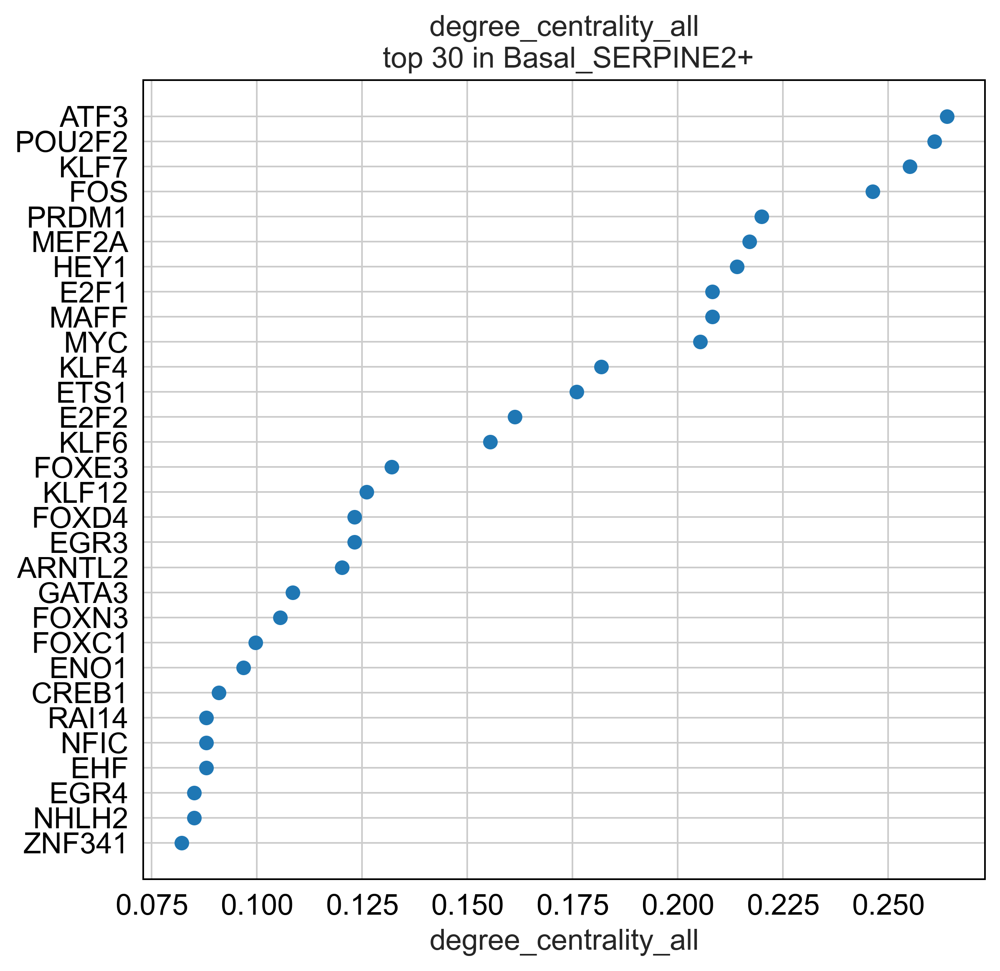

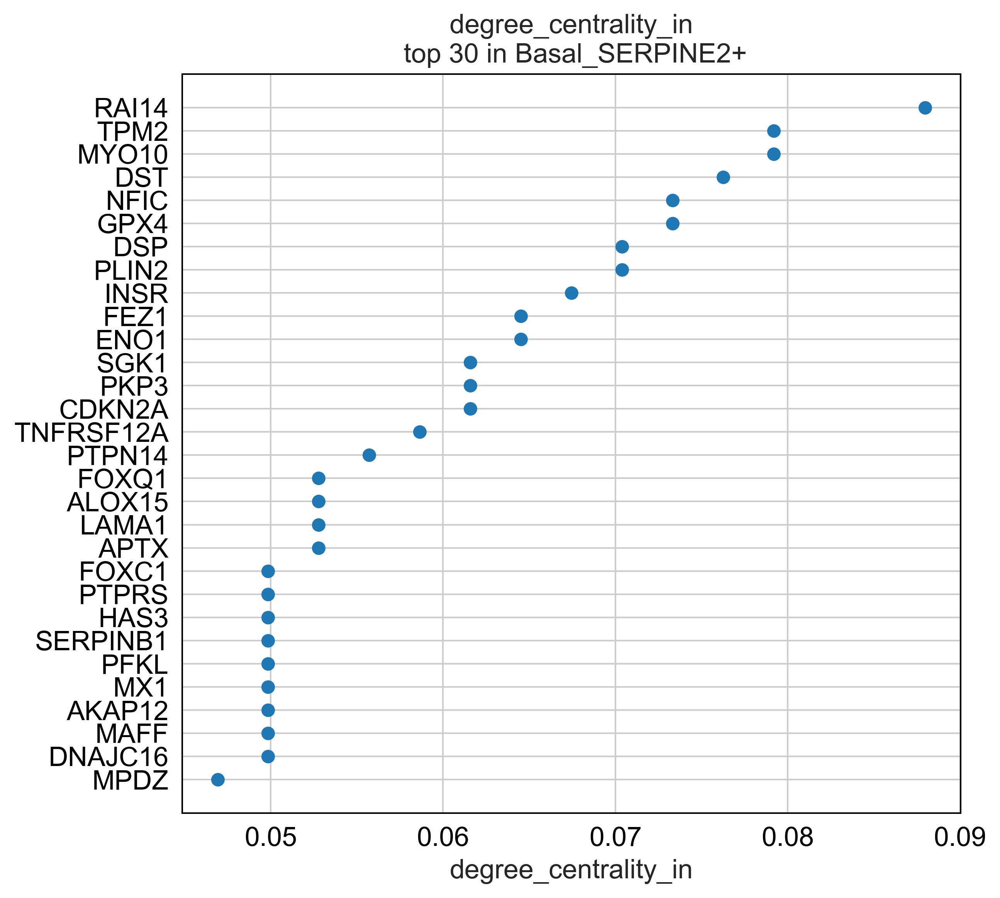

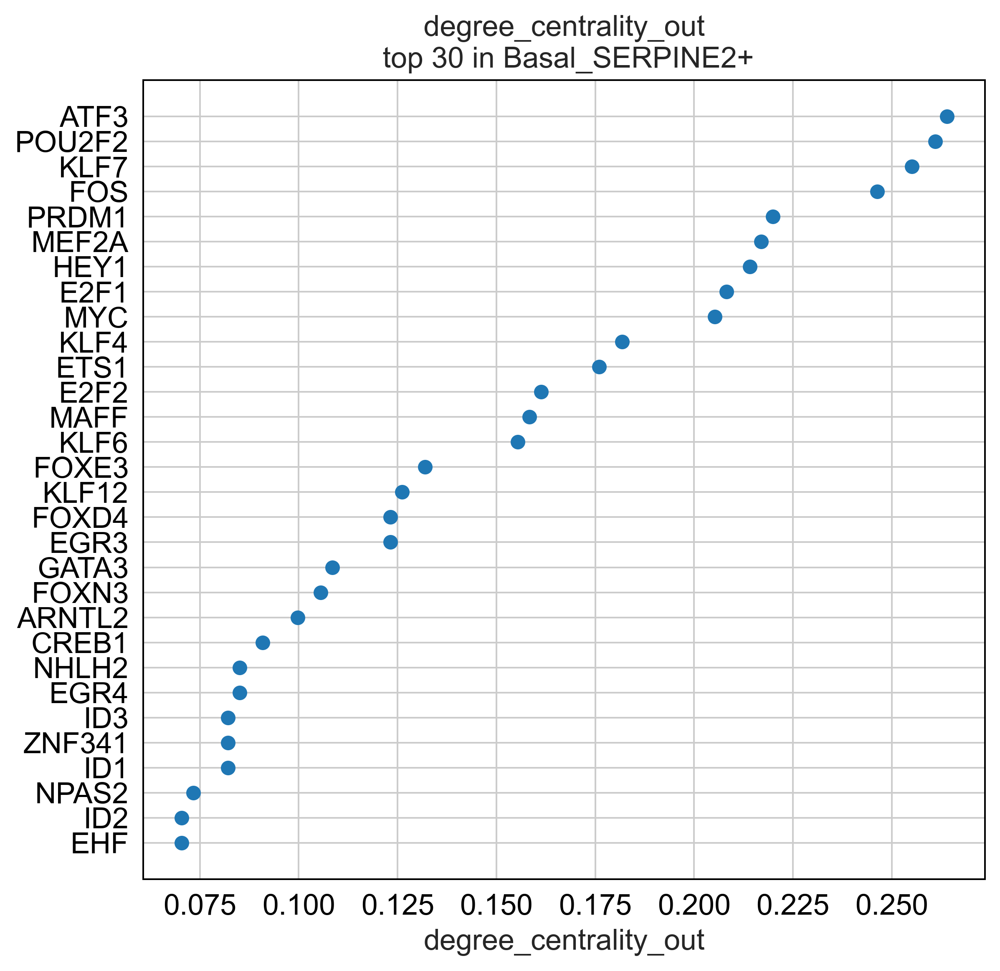

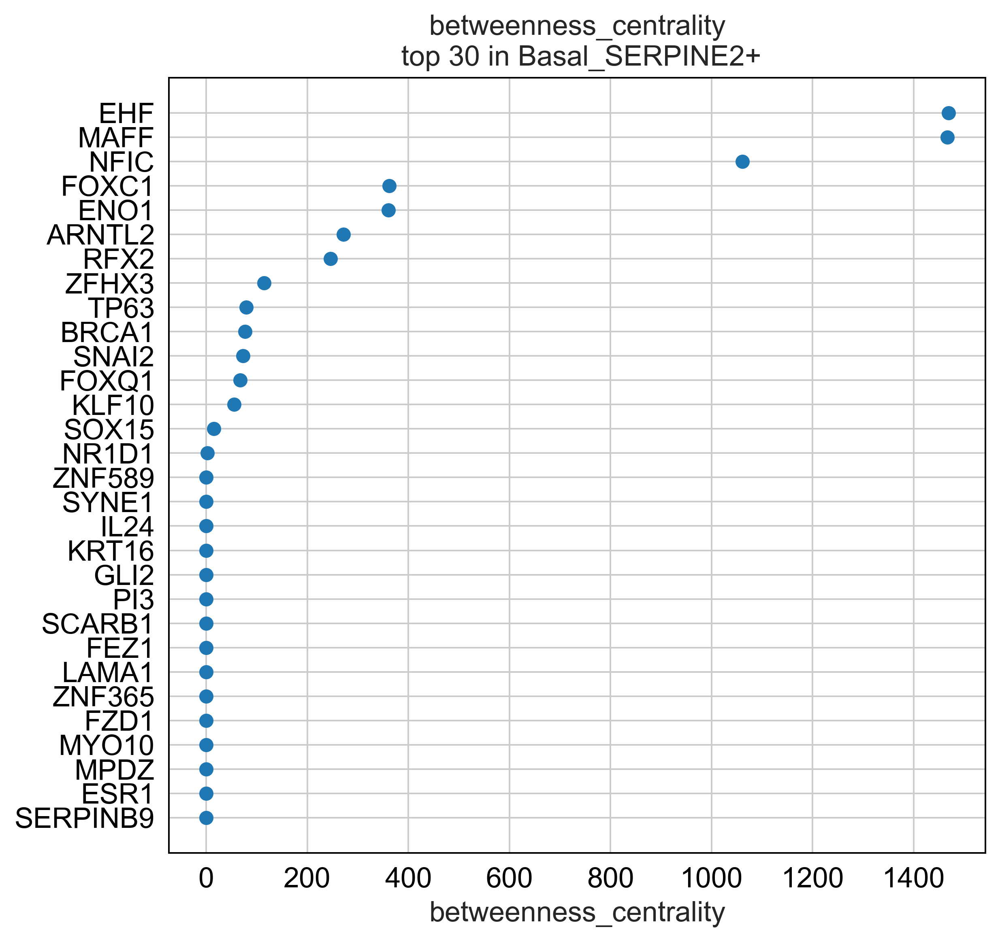

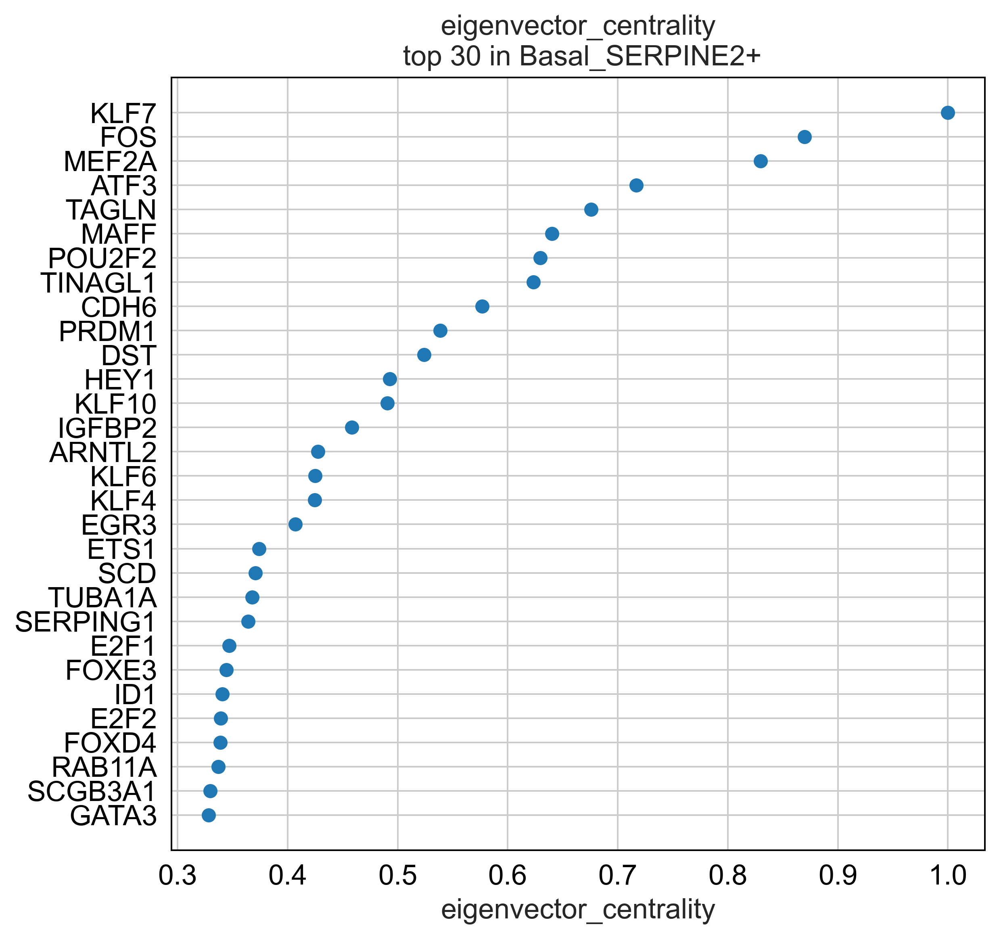

In [36]:
plt.rcParams["figure.figsize"] = [16, 7]
links.plot_scores_as_rank(cluster = "Basal_SERPINE2+", n_gene = 30, save = f"{save_folder}/ranked_score")

In [ ]:
plt.rcParams["figure.figsize"] = [16, 7]
links.plot_scores_as_rank(cluster = "Goblet_12", n_gene = 30, save = f"{save_folder}/ranked_score")

In [ ]:
plt.rcParams["figure.figsize"] = [16, 7]
links.plot_scores_as_rank(cluster = "Basal_16", n_gene = 30, save = f"{save_folder}/ranked_score")

In [ ]:
plt.rcParams["figure.figsize"] = [16, 7]
links.plot_scores_as_rank(cluster = "Basal_22", n_gene = 30, save = f"{save_folder}/ranked_score")

### Compare GRN structur between clusters

In [37]:
links.cluster

['Basal_IGFBP6+',
 'Basal_SERPINE1+',
 'Basal_SERPINE2+',
 'Club_DHRS9+',
 'Goblet_RARRES1+',
 'Goblet_STEAP4+',
 'SupraB_KRT16+',
 'iavAT2_lip',
 'iavClub_SAA1+',
 'iavEpi']

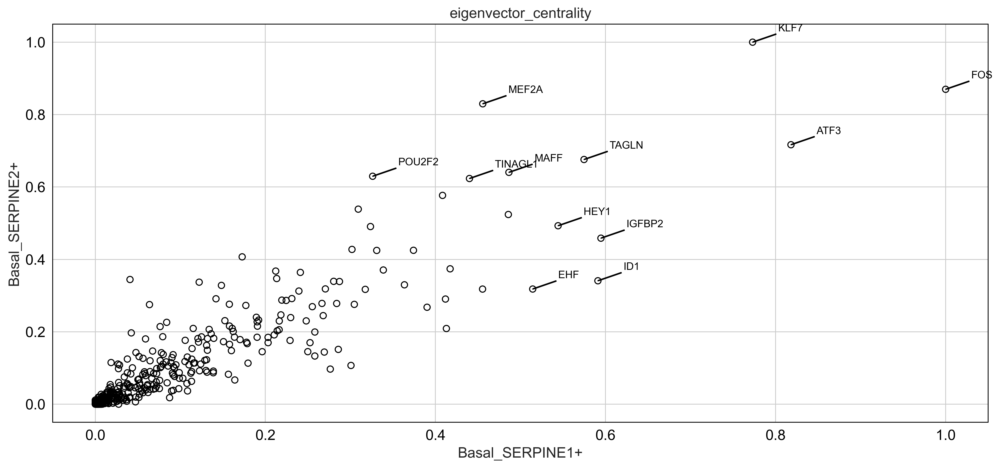

In [38]:
links.plot_score_comparison_2D(value = "eigenvector_centrality",
                               cluster1 = "Basal_SERPINE1+", cluster2 = "Basal_SERPINE2+",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

FOS


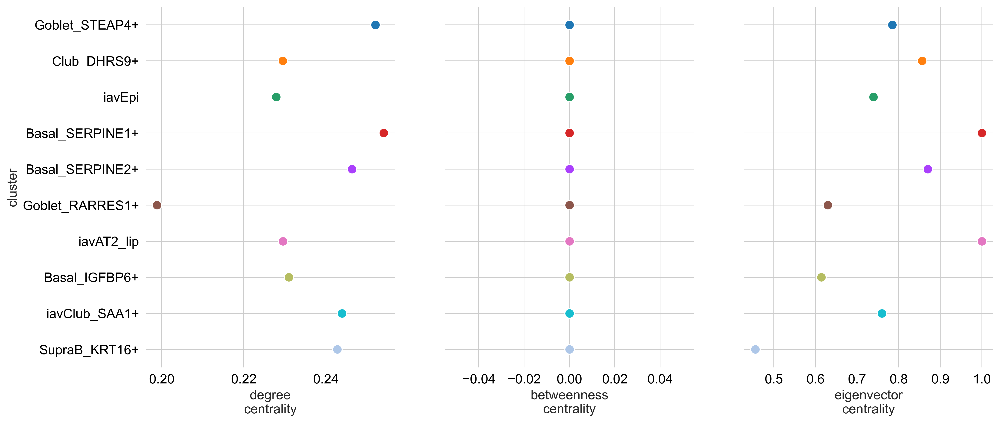

In [39]:
links.plot_score_per_cluster(goi="FOS")

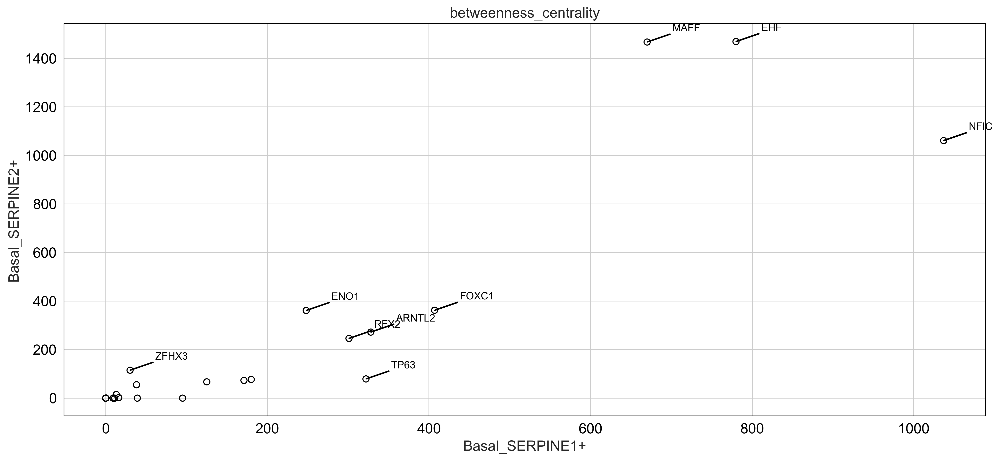

In [40]:
links.plot_score_comparison_2D(value = "betweenness_centrality",
                               cluster1 = "Basal_SERPINE1+", cluster2 = "Basal_SERPINE2+",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

NFIC


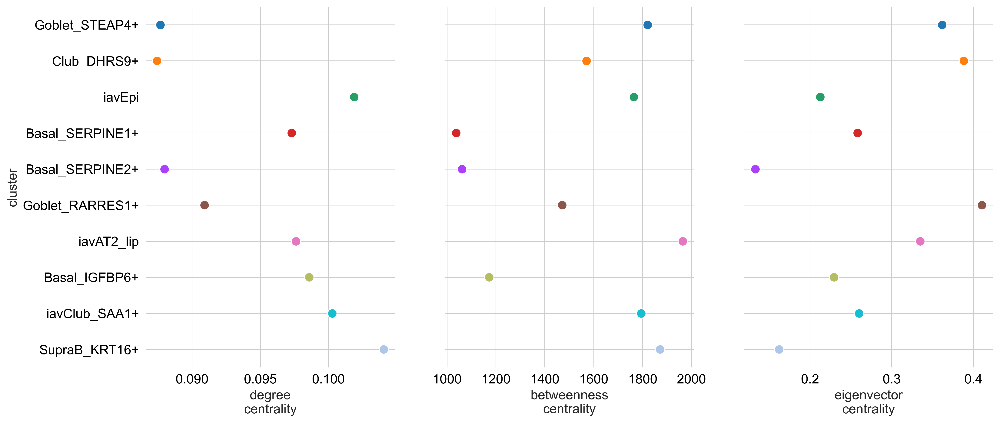

In [41]:
links.plot_score_per_cluster(goi="NFIC")

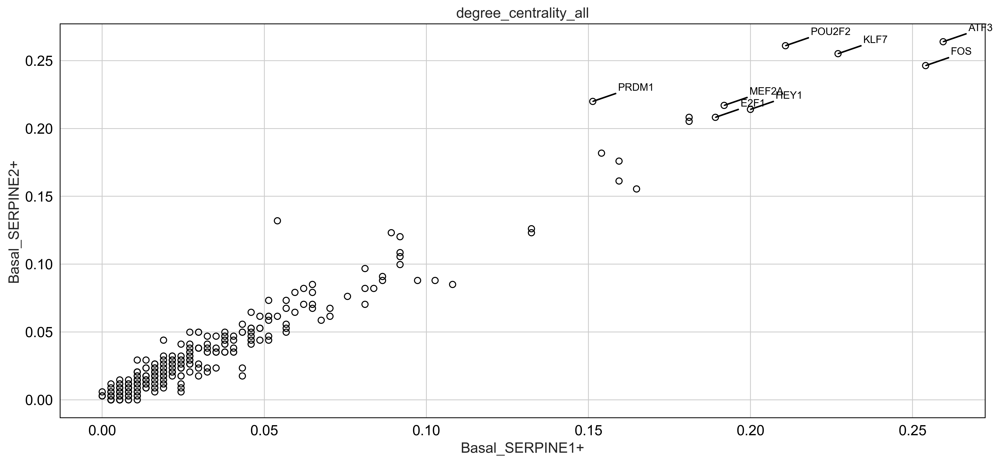

In [42]:
links.plot_score_comparison_2D(value = "degree_centrality_all",
                               cluster1 = "Basal_SERPINE1+", cluster2 = "Basal_SERPINE2+",
                               percentile = 98, save = f"{save_folder}/score_comparison")

ATF3


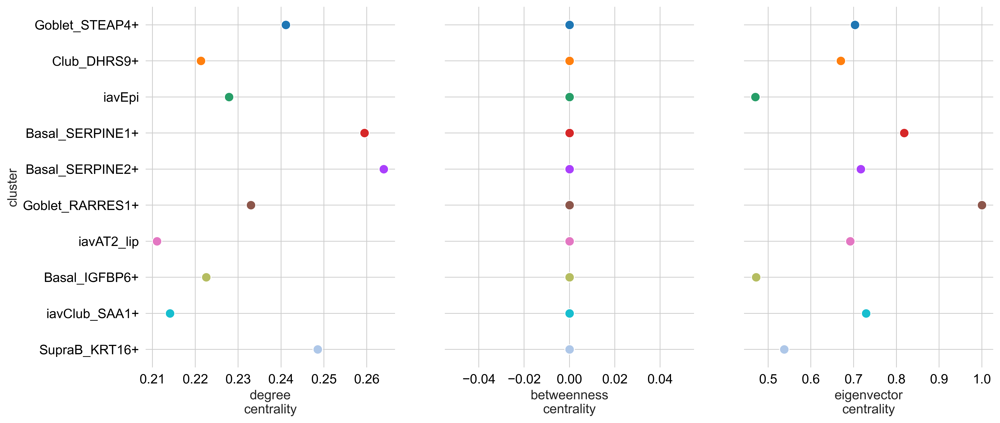

In [43]:
links.plot_score_per_cluster(goi="ATF3")

ATF3


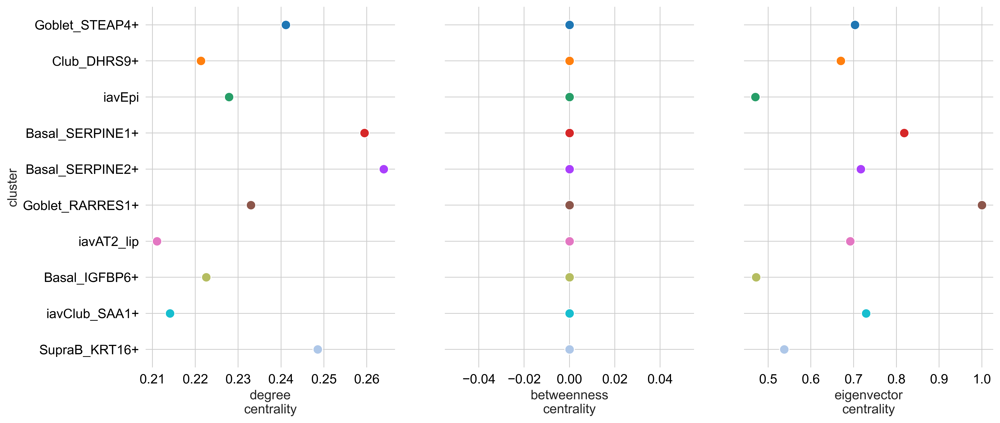

In [44]:
links.plot_score_per_cluster(goi = "ATF3", save = f"{save_folder}/network_score_per_gene/")

In [47]:
cluster_name = "Basal_SERPINE1+"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df_sig = filtered_links_df[filtered_links_df['-logp'] > 10]
filtered_links_df_sig.head()

,source,target,coef_mean,coef_abs,p,-logp
2427,ID1,IGFBP3,1.248352,1.248352,9.736434e-21,20.011600
2410,FOXD4,IFIT2,-1.029371,1.029371,9.724677e-13,12.012125
4177,ESR1,SAA1,0.824734,0.824734,9.834210e-18,17.007261
2413,ID1,IGFBP2,0.801493,0.801493,1.702131e-17,16.769007
4560,EHF,TAGLN,-0.700187,0.700187,2.748882e-15,14.560844


In [48]:
cluster_name = "Basal_SERPINE2+"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df_sig = filtered_links_df[filtered_links_df['-logp'] > 10]
filtered_links_df_sig.head()

,source,target,coef_mean,coef_abs,p,-logp
4177,ESR1,SAA1,0.709155,0.709155,2.276238e-14,13.642782
2427,ID1,IGFBP3,0.639637,0.639637,4.502815e-15,14.346516
2922,GATA3,MMP2,0.583472,0.583472,2.959840e-30,29.528732
2413,ID1,IGFBP2,0.542217,0.542217,2.715392e-19,18.566168
1642,KLF6,FBLIM1,0.432847,0.432847,5.568926e-15,14.254229


In [49]:
grouped = filtered_links_df.groupby('source')['target'].apply(list)

# Print the groups and their associated targets
for source, targets in grouped.items():
    print(f"Source: {source}")
    print(f"Targets: {targets}")
    print()  # Add an empty line for readability

Source: AR
Targets: ['SAA1', 'FBLIM1', 'SNAI2', 'NREP', 'ZNF391', 'COLCA2', 'VTCN1', 'CDKN1A', 'ZNF704', 'FOXC1', 'SGK1', 'PIP', 'MPDZ', 'SCARB1', 'DMTN', 'CD274', 'PTPRS', 'HMGCS1']

Source: ARNTL2
Targets: ['KRT17', 'ACKR3', 'AKAP12', 'IGFBP2', 'CDKN2A', 'FGF1', 'PLIN2', 'IGFBP3', 'HAS3', 'RAI14', 'PDZK1IP1', 'TPM2', 'ENO1', 'FEZ1', 'MYO10', 'EHF', 'MT1G', 'SGK1', 'FIBIN', 'INSR', 'PTPRS', 'PPP6R2', 'PFKL', 'NFIC', 'LAMA1', 'ILF3-DT', 'DNAJC16', 'ARRB2', 'FAM210A', 'RAP1GAP2', 'GALT', 'AQP5', 'PRDM15', 'APTX']

Source: ARX
Targets: ['LRMDA']

Source: ATF3
Targets: ['DDX58', 'GNB4', 'TXNRD1', 'SCGB3A1', 'FADS2', 'TAGLN', 'CDH6', 'KRT17', 'ALDH1A3', 'EDN1', 'RNF19B', 'GPR158', 'DDIT4', 'TUBA1A', 'ARNTL2', 'CD274', 'CDKN2B', 'NEDD9', 'THBS1', 'PDZK1IP1', 'TINAGL1', 'BIRC3', 'HBEGF', 'ADK', 'SERPINB1', 'BASP1', 'AQP3', 'CXCL6', 'KLF10', 'CDKN2A', 'TGFB1I1', 'SLC44A4', 'MDM2', 'CMTM3', 'AKAP12', 'CDKN1A', 'TRIB3', 'SCNN1A', 'MX1', 'GMPR', 'MAFF', 'DST', 'PIP', 'TNFRSF12A', 'SERPINB9', 'PG

In [50]:
# Convert the grouped data into a DataFrame
result_df = grouped.reset_index(name = 'targets')
result_df.head()

,source,targets
0,AR,"[SAA1, FBLIM1, SNAI2, NREP, ZNF391, COLCA2, VT..."
1,ARNTL2,"[KRT17, ACKR3, AKAP12, IGFBP2, CDKN2A, FGF1, P..."
2,ARX,[LRMDA]
3,ATF3,"[DDX58, GNB4, TXNRD1, SCGB3A1, FADS2, TAGLN, C..."
4,BCL11B,"[IDO1, VEGFA, RBBP8, CD274, SGK1, HR, IFNL1]"


In [51]:
filtered_df = result_df[result_df['source'] == 'ATF3']
targets = filtered_df['targets'].tolist()

In [52]:
print(targets)

[['DDX58', 'GNB4', 'TXNRD1', 'SCGB3A1', 'FADS2', 'TAGLN', 'CDH6', 'KRT17', 'ALDH1A3', 'EDN1', 'RNF19B', 'GPR158', 'DDIT4', 'TUBA1A', 'ARNTL2', 'CD274', 'CDKN2B', 'NEDD9', 'THBS1', 'PDZK1IP1', 'TINAGL1', 'BIRC3', 'HBEGF', 'ADK', 'SERPINB1', 'BASP1', 'AQP3', 'CXCL6', 'KLF10', 'CDKN2A', 'TGFB1I1', 'SLC44A4', 'MDM2', 'CMTM3', 'AKAP12', 'CDKN1A', 'TRIB3', 'SCNN1A', 'MX1', 'GMPR', 'MAFF', 'DST', 'PIP', 'TNFRSF12A', 'SERPINB9', 'PGF', 'PHACTR4', 'CPM', 'NAAA', 'FOXC1', 'FOXQ1', 'PLIN2', 'HAS3', 'DSP', 'ENO1', 'SYTL2', 'PKP3', 'LRG1', 'DMTN', 'WDR70', 'VTCN1', 'GCNT2', 'SGK1', 'LAMA1', 'TPM2', 'ILF3-DT', 'SCARB1', 'HMGCS1', 'PIEZO2', 'BPIFA2', 'CPNE4', 'PPP6R2', 'INSR', 'SLC43A2', 'UBAC2', 'PFKL', 'RAP1GAP2', 'RAI14', 'DGKI', 'FEZ1', 'FAM210A', 'MPDZ', 'GALT', 'PATL2', 'PTPRS', 'SCNN1B', 'PCCA', 'DOP1B', 'CD70', 'LOXL1']]


In [53]:
markers = ['DDX58', 'GNB4', 'TXNRD1', 'SCGB3A1', 'FADS2', 'TAGLN', 'CDH6', 'KRT17', 'ALDH1A3', 'EDN1', 'RNF19B', 'GPR158', 'DDIT4', 'TUBA1A', 'ARNTL2', 'CD274', 'CDKN2B', 'NEDD9', 'THBS1', 'PDZK1IP1', 'TINAGL1', 'BIRC3', 'HBEGF', 'ADK', 'SERPINB1', 'BASP1', 'AQP3', 'CXCL6', 'KLF10', 'CDKN2A', 'TGFB1I1', 'SLC44A4', 'MDM2', 'CMTM3', 'AKAP12', 'CDKN1A', 'TRIB3', 'SCNN1A', 'MX1', 'GMPR', 'MAFF', 'DST', 'PIP', 'TNFRSF12A', 'SERPINB9', 'PGF', 'PHACTR4', 'CPM', 'NAAA', 'FOXC1', 'FOXQ1', 'PLIN2', 'HAS3', 'DSP', 'ENO1', 'SYTL2', 'PKP3', 'LRG1', 'DMTN', 'WDR70', 'VTCN1', 'GCNT2', 'SGK1', 'LAMA1', 'TPM2', 'ILF3-DT', 'SCARB1', 'HMGCS1', 'PIEZO2', 'BPIFA2', 'CPNE4', 'PPP6R2', 'INSR', 'SLC43A2', 'UBAC2', 'PFKL', 'RAP1GAP2', 'RAI14', 'DGKI', 'FEZ1', 'FAM210A', 'MPDZ', 'GALT', 'PATL2', 'PTPRS', 'SCNN1B', 'PCCA', 'DOP1B', 'CD70', 'LOXL1']

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:19)
Storing dendrogram info using `.uns['dendrogram_mixed_states']`


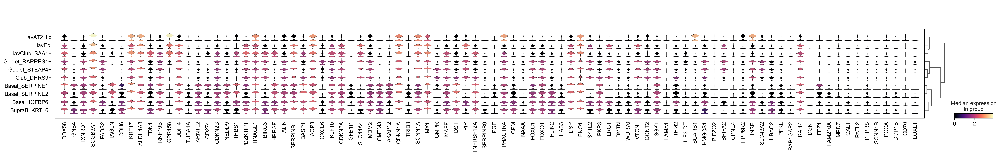

In [54]:
sc.pl.stacked_violin(adata_log, markers, groupby = 'mixed_states', layer = 'sqrt_norm', cmap = 'magma', dendrogram = True)

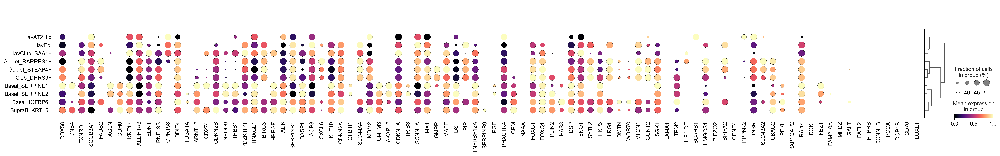

In [55]:
sc.pl.dotplot(adata_log, markers, groupby='mixed_states', dendrogram=True, dot_max=0.5, dot_min=0.3, standard_scale='var', layer = 'sqrt_norm', cmap = 'magma')

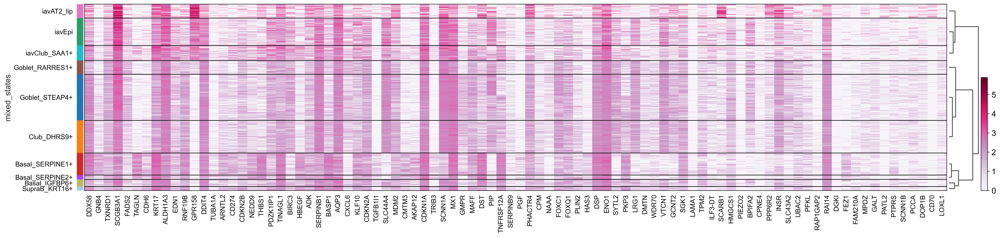

In [64]:
sc.pl.heatmap(adata_log, markers, groupby = 'mixed_states', layer = 'sqrt_norm', cmap = 'PuRd', dendrogram = True, show_gene_labels = True)